# Mini-project n° 1 – Qui a peint ce tableau ?

## _High-Dimensional-Deep-Learning_
5 GMM
Institut National des Sciences Appliquées de Toulouse
#### Autors:
* BUI Minh Thi
* NGUYEN Thanh Chung
* OPDAL Vilde
* VAZQUEZ ARELLANO Laura Karina
---


## Introduction
In this project, we aim to address the challenge posed by the Art Challenge dataset: identifying the artist of a given painting, avaible on https://artchallenge.ru/?lang=fr#.

This dataset provides a unique opportunity to explore high-dimensional image classification using deep learning techniques.

The dataset extracted from the site above:
Art Challenge – plmlab.math.cnrs.fr/chevallier-teaching/datasets/art-challenge, consists of:

* a file named _artists.csv_, which provides metadata about the artists, such as their biographical details, artistic styles, and the number of works included in the dataset.
* a folder _images_hq_, which has a collection of high-definition images organized by artist.
* and a folder _images_lq_, containing the same paintings in lower resolution.

To address the challenge of recognizing the artist behind a painting, we will utilize VGG16, a pre-trained convolutional neural network known for its robust performance in image classification tasks. Additionally, we will employ data augmentation techniques to enhance the diversity of our training dataset and improve model generalization. This approach allows us to effectively adapt VGG16 to our specific task while managing the potential limitations of the dataset size.

---

## Libraries

In [ ]:
# Utils
import os
import shutil
import time

# Maths - Stats
import math
import sklearn
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import random as rd

# Data visualization
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import PIL
from PIL import Image
import os, sys

# Deep Learning Librairies
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, save_img


In [ ]:
tf.config.list_physical_devices()
[k.device_type for k in tf.config.list_physical_devices()]

['CPU', 'GPU']

## Dataset
As explained in the introduction, the dataset used in this project was extracted from the site above: Art Challenge – plmlab.math.cnrs.fr/chevallier-teaching/datasets/art-challenge

In [ ]:
!git clone https://plmlab.math.cnrs.fr/chevallier-teaching/datasets/art-challenge.git

Cloning into 'art-challenge'...
remote: Enumerating objects: 17127, done.
remote: Total 17127 (delta 0), reused 0 (delta 0), pack-reused 17127 (from 1)
Receiving objects: 100% (17127/17127), 2.16 GiB | 20.39 MiB/s, done.
Resolving deltas: 100% (173/173), done.
Updating files: 100% (16806/16806), done.


Our data is organized this way :

```
 art-challenge
└─── images_hq/
│   └───Albrecht_Dürer /
│   │   │   Albrecht_Dürer_1.jpg
│   │   │   Albrecht_Dürer_10.jpg
│   │   │   ...
│   └───Alfred_Sisley /
│   │   │   Alfred_Sisley_1.jpg
│   │   │   Alfred_Sisley_10.jpg
│   │   │   ...
│   │   ...
└─── images_lq/
│   │   Albrecht_Dürer_1.jpg
│   │   Albrecht_Dürer_10.jpg
│   │   ...
│   │   Alfred_Sisley_1.jpg
│   │   Alfred_Sisley_10.jpg
│   │   ...
```

In [ ]:
# Path to the datasets
path = "./art-challenge/"

##### Displaying and comparing a high and low definition image of the dataset </i>

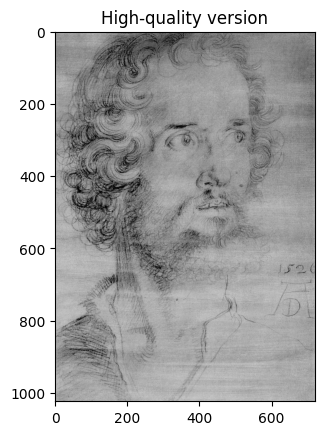

Image shape:  3


In [ ]:
img = plt.imread('art-challenge/images_hq/Albrecht_Dürer/Albrecht_Dürer_1.jpg')
plt.imshow(img)
plt.title('High-quality version')
plt.show()
print ('Image shape: ',img.shape[-1])

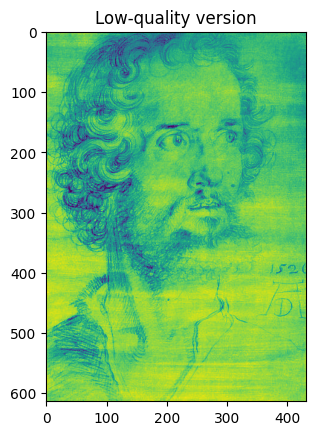

Image shape:  432


In [ ]:
img = plt.imread('art-challenge/images_lq/Albrecht_Dürer_1.jpg')
plt.imshow(img)
plt.title('Low-quality version')
plt.show()
print ('Image shape: ',img.shape[-1])

The output 432 from img.shape[-1] suggests that img is likely not loaded as a standard 3- or 4-channel image array but may instead represent a flattened or reshaped array. This might happen if Matplotlib or the image library misinterprets the file format.

To handdle the issue we will convert to an RGB array if necessary:

In [ ]:
def load_and_display_image(image_path, quality):
    """
    Load an image, convert to RGB if necessary, and display it using Matplotlib.

    Parameters:
    - image_path (str): The file path to the image.
    """
    img_pil = Image.open(image_path)
    img = np.array(img_pil.convert("RGB"))

    plt.imshow(img)
    plt.axis('off')
    if quality == 'hq' :
      plt.title('High-quality version')
    if quality == 'lq':
      plt.title('Low-quality version')

    plt.show()
    print ('Image shape: ',img.shape[-1])


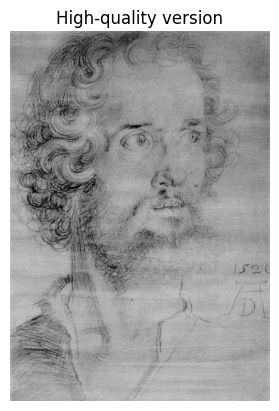

Image shape:  3


In [ ]:
load_and_display_image('art-challenge/images_hq/Albrecht_Dürer/Albrecht_Dürer_1.jpg', 'hq')

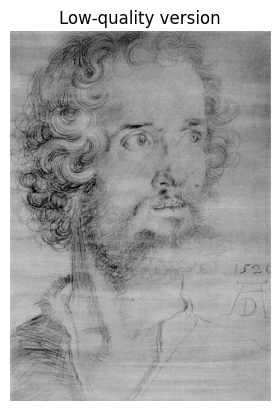

Image shape:  3


In [ ]:
load_and_display_image('art-challenge/images_lq/Albrecht_Dürer_1.jpg', 'lq')

Chosen images to study

Given that the quality difference between high- and low-quality images appears minimal to the human eye, we decided to use the low-quality images. The idea is to leverage the low-resolution dataset for finding a suitable model architecture and hyperparameters, then potentially fine-tune the model on high-quality images if necessary.

This approach is justified by the fact that VGG16 reduces the input image into a latent space representation through successive convolutional and pooling layers. These layers focus on extracting high-level features such as edges, shapes, and textures, rather than preserving fine details in the input image. Consequently, the additional information in high-quality images may not significantly impact the model’s performance, especially for tasks like artist classification, where distinguishing features are often captured at a higher abstraction level.

By working with low-quality images, we reduce computational costs and memory usage without sacrificing the effectiveness of the feature extraction process, making this approach both efficient and practical.

##### Distribution of paints per artist

In [ ]:
image_folder = "./art-challenge/images_lq/"
image_data = []


for image_name in os.listdir(image_folder):
    if image_name.endswith(".jpg"):
        # Extract artist name from the file name (e.g., "Albrecht_Dürer_1.jpg" -> "Albrecht_Dürer")
        artist_name = "_".join(image_name.split("_")[:-1])
        image_data.append({
            'filename': image_name,
            'label': artist_name
        })

        img_path = os.path.join(image_folder, image_name)
        img = load_img(img_path)

# Create Data DataFrame with 'filename' and 'label' columns
Data = pd.DataFrame(image_data)
print(Data.head(5))
print('--------------------------')
print(f"Total number of images: {len(Data)}")


                   filename              label
0      Andrei_Rublev_21.jpg      Andrei_Rublev
1        Frida_Kahlo_51.jpg        Frida_Kahlo
2       Edgar_Degas_543.jpg        Edgar_Degas
3      Rene_Magritte_34.jpg      Rene_Magritte
4  Peter_Paul_Rubens_10.jpg  Peter_Paul_Rubens
--------------------------
Total number of images: 8355


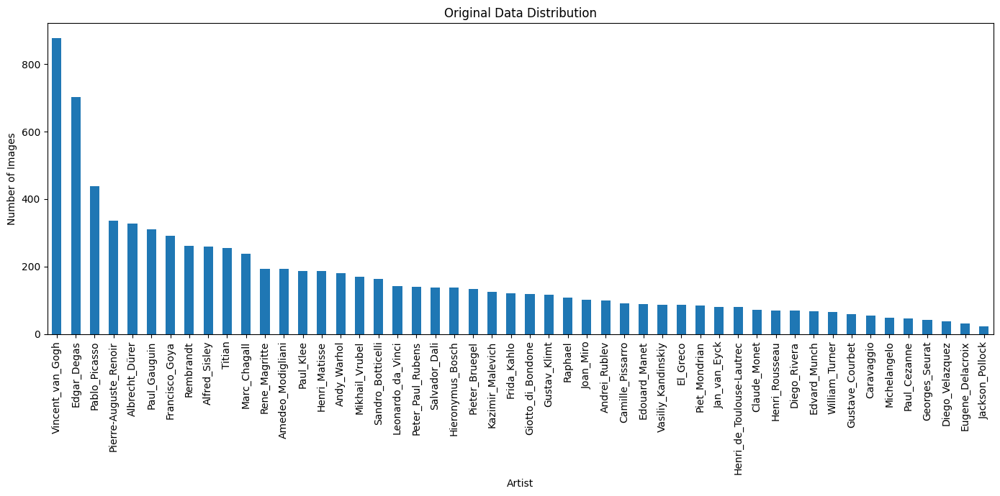

In [ ]:
def plot_distribution(data, title):
    counts = data['label'].value_counts()
    plt.figure(figsize=(14, 7))
    counts.plot(kind='bar')
    plt.title(title)
    plt.xlabel('Artist')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

plot_distribution(Data, "Original Data Distribution")

The plot "Original Data Distribution" reveals that a few artists, such as Vincent Van Gogh and Edgar Degas, have a disproportionately large number of paintings (over 600), while many other artists are represented with only around 150 paintings.

#### Applying truncation rules

A balanced dataset is essential to prevent the model from overfitting to the works of a few artists and underperforming on those of others.

To address this imbalance, we decided to apply two measures: first, we excluded artists with fewer than 150 images, and second, we capped the maximum number of images per artist at 200. This approach ensures a more uniform distribution of data across all classes, which is crucial for training a fair and effective model.

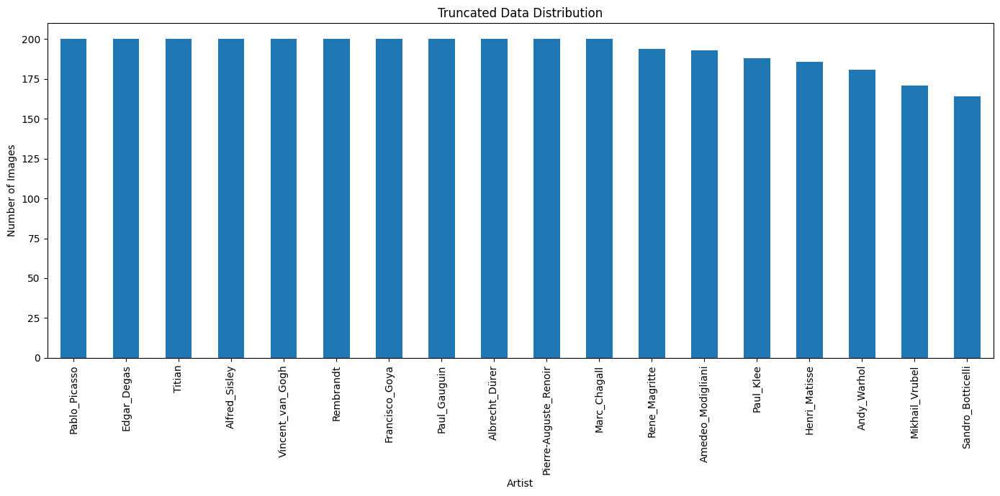

In [ ]:
min_images = 150
max_images = 200

# Filter out artists with insufficient images
artist_counts = Data['label'].value_counts()
filtered_artists = artist_counts[(artist_counts >= min_images) & (artist_counts <= max_images)].index

# Filter the dataset
Data_truncated = Data[Data['label'].isin(filtered_artists)].copy()

# Truncate artists with too many images
for artist in artist_counts[artist_counts > max_images].index:
    # Keep only a random sample of `max_images`
    artist_data = Data[Data['label'] == artist]
    sampled_data = artist_data.sample(max_images, random_state=42)
    Data_truncated = pd.concat([Data_truncated, sampled_data])

# Plot the truncated data distributioAmedeo_Modiglianin
plot_distribution(Data_truncated, "Truncated Data Distribution")

After applying these rules, we retained 18 artists, who will subsequently serve as our classification labels.

In [ ]:
# Print the size of the truncated dataset
print(f"Size of Data_truncated: {len(Data_truncated)}")
print(f"Shape of Data_truncated: {Data_truncated.shape}")
num_unique_labels = Data_truncated['label'].nunique()
print(f"Number of unique labels (artists): {num_unique_labels}")
print(Data_truncated.head(5))

Size of Data_truncated: 3477
Shape of Data_truncated: (3477, 2)
Number of unique labels (artists): 18
                filename          label
3   Rene_Magritte_34.jpg  Rene_Magritte
21  Henri_Matisse_28.jpg  Henri_Matisse
30     Paul_Klee_158.jpg      Paul_Klee
32   Andy_Warhol_163.jpg    Andy_Warhol
42      Paul_Klee_85.jpg      Paul_Klee


#### Creation of Dataframe
Split Data into train (70%), validation (15%), and test (15%) sets.

In [ ]:
train_df, temp_df = train_test_split(Data_truncated, test_size=0.3, stratify=Data_truncated['label'], random_state=42)
validation_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['label'], random_state=42)

#### Organizing images into separate folders


In [ ]:
base_dir = "./art_challenge_dataset/"
os.makedirs(base_dir, exist_ok=True)

def organize_data(df, subset_name):
    # Create the main directory for the subset (train/validation/test)
    subset_dir = os.path.join(base_dir, subset_name)
    os.makedirs(subset_dir, exist_ok=True)

    # Create a directory to hold all images (not artist-specific)
    all_images_dir = os.path.join(subset_dir, "all_images")
    os.makedirs(all_images_dir, exist_ok=True)

    # Loop through the dataset and copy each image to the appropriate directory
    for _, row in df.iterrows():
        # Organize by artist (individual artist folders)
        artist_dir = os.path.join(subset_dir, row['label'])
        os.makedirs(artist_dir, exist_ok=True)

        # Copy the image to the artist-specific folder
        src_path = os.path.join(image_folder, row['filename'])
        dst_path = os.path.join(artist_dir, row['filename'])
        shutil.copy(src_path, dst_path)

        # Copy the image to the all_images folder
        dst_path_all_images = os.path.join(all_images_dir, os.path.basename(row['filename']))
        shutil.copy(src_path, dst_path_all_images)

organize_data(train_df, "train1")
organize_data(validation_df, "validation1")
organize_data(test_df, "test1")

Our data is now organized this way :

```
 /art_challenge_dataset
└─── train1/
│   └───Albrecht_Dürer /
│   │   │   Albrecht_Dürer_1.jpg
│   │   │   Albrecht_Dürer_10.jpg
│   │   │   ...
│   └───Alfred_Sisley /
│   │   │   Alfred_Sisley_1.jpg
│   │   │   Alfred_Sisley_10.jpg
│   │   │   ...
│   │   ...
│   │   all_images /
│   │   │   Alfred_Sisley_1.jpg
│   │   │   Alfred_Sisley_10.jpg
│   │   │   ...
└─── validation1/
│   └───Albrecht_Dürer /
│   │   │   Albrecht_Dürer_1.jpg
│   │   │   Albrecht_Dürer_10.jpg
│   │   │   ...
│   └───Alfred_Sisley /
│   │   │   Alfred_Sisley_1.jpg
│   │   │   Alfred_Sisley_10.jpg
│   │   │   ...
│   │   ...
│   │   all_images /
│   │   │   Alfred_Sisley_1.jpg
│   │   │   Alfred_Sisley_10.jpg
│   │   │   ...
└─── test1/
│   └───Albrecht_Dürer /
│   │   │   Albrecht_Dürer_1.jpg
│   │   │   Albrecht_Dürer_10.jpg
│   │   │   ...
│   └───Alfred_Sisley /
│   │   │   Alfred_Sisley_1.jpg
│   │   │   Alfred_Sisley_10.jpg
│   │   │   ...
│   │   ...
│   │   all_images /
│   │   │   Alfred_Sisley_1.jpg
│   │   │   Alfred_Sisley_10.jpg
│   │   │   ...
```

In [ ]:
total_train0 = train_df.shape[0]
total_validation0 = validation_df.shape[0]
total_test0 = test_df.shape[0]

print("We have %d training data, %d validation data and %d test data, all labels (artists) combined." %
      (total_train0, total_validation0, total_test0))

We have 2433 training data, 522 validation data and 522 test data, all labels (artists) combined.


In [ ]:
# Check distribution of images by artist in each set
train_counts = train_df['label'].value_counts()
validation_counts = validation_df['label'].value_counts()
test_counts = test_df['label'].value_counts()

# Display distribution counts for each artist in train, validation, and test sets
print("Training set distribution:\n", train_counts)
#print("\nValidation set distribution:\n", validation_counts)
#print("\nTest set distribution:\n", test_counts)

Training set distribution:
 label
Edgar_Degas              140
Titian                   140
Alfred_Sisley            140
Albrecht_Dürer           140
Pablo_Picasso            140
Paul_Gauguin             140
Vincent_van_Gogh         140
Pierre-Auguste_Renoir    140
Francisco_Goya           140
Rembrandt                140
Marc_Chagall             140
Rene_Magritte            136
Amedeo_Modigliani        135
Paul_Klee                131
Henri_Matisse            130
Andy_Warhol              126
Mikhail_Vrubel           120
Sandro_Botticelli        115
Name: count, dtype: int64


Balancing only the training dataset :

In [ ]:
from sklearn.utils import resample

# Oversample the minority classes in training data
max_samples = train_counts.max()  # Target sample size for each class
oversampled_dfs = []

for label, count in train_counts.items():
    class_df = train_df[train_df['label'] == label]
    oversampled_class_df = resample(class_df, replace=True, n_samples=max_samples, random_state=42)
    oversampled_dfs.append(oversampled_class_df)

# Combine all oversampled data
balanced_train_df = pd.concat(oversampled_dfs)

# Verify new class distribution
print(balanced_train_df['label'].value_counts())


label
Edgar_Degas              140
Titian                   140
Alfred_Sisley            140
Albrecht_Dürer           140
Pablo_Picasso            140
Paul_Gauguin             140
Vincent_van_Gogh         140
Pierre-Auguste_Renoir    140
Francisco_Goya           140
Rembrandt                140
Marc_Chagall             140
Rene_Magritte            140
Amedeo_Modigliani        140
Paul_Klee                140
Henri_Matisse            140
Andy_Warhol              140
Mikhail_Vrubel           140
Sandro_Botticelli        140
Name: count, dtype: int64


Reset the index of the balanced DataFrame to ensure indices are sequential :

In [ ]:
balanced_train_df = balanced_train_df.reset_index(drop=True)
balanced_train_df[balanced_train_df['label'] == "Andy_Warhol"].head(-5)

,filename,label
2100,Andy_Warhol_78.jpg,Andy_Warhol
2101,Andy_Warhol_26.jpg,Andy_Warhol
2102,Andy_Warhol_168.jpg,Andy_Warhol
2103,Andy_Warhol_148.jpg,Andy_Warhol
2104,Andy_Warhol_162.jpg,Andy_Warhol
...,...,...
2230,Andy_Warhol_64.jpg,Andy_Warhol
2231,Andy_Warhol_93.jpg,Andy_Warhol
2232,Andy_Warhol_148.jpg,Andy_Warhol
2233,Andy_Warhol_139.jpg,Andy_Warhol


In [ ]:
total_train = balanced_train_df.shape[0]
total_validation = validation_df.shape[0]
total_test = test_df.shape[0]

print("We have %d training data, %d validation data and %d test data, all labels (artists) combined." %
      (total_train, total_validation, total_test))

We have 2520 training data, 522 validation data and 522 test data, all labels (artists) combined.


In [ ]:
path_dataset = "./art_challenge_dataset/"

## Pre-processing

#### Fluctuations in image shapes

We consider the fluctuations in image shapes within the dataset. Images vary in dimensions, which can introduce inconsistencies during training.

Most common heigth : 614 pixels (451 occurrences)
Most common width : 614 pixels (360 occurrences)


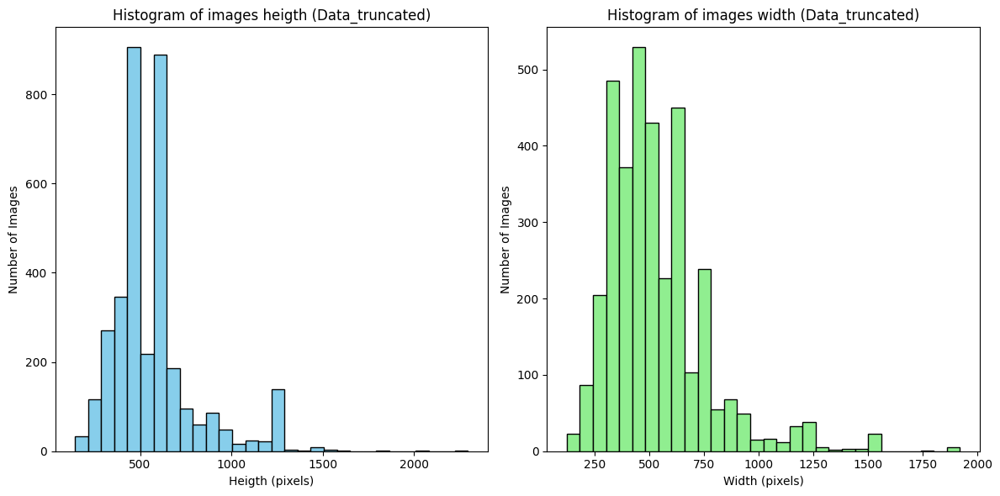

In [ ]:
from collections import Counter
heights = []
widths = []

for filename in Data_truncated['filename']:
    img_path = os.path.join(image_folder, filename)
    img = load_img(img_path)
    widths.append(img.size[0])
    heights.append(img.size[1])

dimension_h_counter = Counter(heights)
dimension_w_counter = Counter(widths)

most_common_h_dimension = dimension_h_counter.most_common(1)[0]
most_common_w_dimension = dimension_w_counter.most_common(1)[0]


print(f"Most common heigth : {most_common_h_dimension[0]} pixels ({most_common_h_dimension[1]} occurrences)")
print(f"Most common width : {most_common_w_dimension[0]} pixels ({most_common_w_dimension[1]} occurrences)")


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.hist(heights, bins=30, color='skyblue', edgecolor='black')
plt.title("Histogram of images heigth (Data_truncated)")
plt.xlabel("Heigth (pixels)")
plt.ylabel("Number of Images")


plt.subplot(1, 2, 2)
plt.hist(widths, bins=30, color='lightgreen', edgecolor='black')
plt.title("Histogram of images width (Data_truncated)")
plt.xlabel("Width (pixels)")
plt.ylabel("Number of Images")


plt.tight_layout()
plt.show()

As we see in both histograms, images in the dataset have varying dimensions, which poses a challenge as neural networks require consistent input sizes. To address this, we need to resize all images to a common dimension.

When choosing the target size, a smaller resolution like \(64 x 64\) might allow for quicker experimentation but could compromise the model's ability to capture detailed features. Conversely, larger sizes like \(128 x 128\) or \(256 x 256\) would likely yield better results but require significantly longer training times.

Considering these trade-offs, we selected \(224 x 224\) as the target image size. This dimension aligns with the input requirements of the VGG16 architecture, which is pretrained on images of this size. Additionally, we applied a normalization step by dividing pixel values by 255 to scale them to the range [0, 1], ensuring compatibility with the preprocessing used during VGG16's training.


#### Resizing and normalization

In [ ]:
batch_size = 32
img_width = 224
img_height = 224

To ensure stability and consistency during training, the batch size must divide evenly into the number of training (N_train) and validation (N_validation) samples. If this condition is not met, it can result in incomplete batches, which may lead to issues during optimization or evaluation.

To address this, we opted to set `drop_remainder=True` in our data generators. This configuration discards any remaining images that do not fit into a complete batch. While this approach slightly reduces the size of the training and validation datasets, it ensures that all batches are uniform, thereby maintaining stability during the training process.

In [ ]:
path_dataset = "./art_challenge_dataset/"

# Training images
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_dataframe(
    balanced_train_df,
    directory=path_dataset + "train1/all_images/",
    x_col='filename',
    y_col='label',
    target_size=(img_width, img_height),
    interpolation="bilinear",
    class_mode='categorical',
    batch_size=batch_size,
    drop_remainder=True  # Ensures batches are full

)

# Validation images
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validation_df,
    directory=path_dataset + "validation1/all_images/",
    x_col='filename',
    y_col='label',
    target_size=(img_width, img_height),
    interpolation="bilinear",
    class_mode='categorical',
    batch_size=batch_size,
    drop_remainder=True  # Ensures batches are full
)

# Test images
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    test_df,
    directory=path_dataset + "test1/all_images/",
    x_col='filename',
    y_col='label',
    target_size=(img_width, img_height),
    interpolation="bilinear",
    class_mode='categorical',
    batch_size=batch_size,
    drop_remainder=True  # Ensures batches are full

)


Found 2520 validated image filenames belonging to 18 classes.
Found 522 validated image filenames belonging to 18 classes.
Found 522 validated image filenames belonging to 18 classes.


In [ ]:
print(f"Number of batches for training : {train_generator.samples // batch_size}")
print(f"Number of batches for validation : {validation_generator.samples // batch_size}")
print(f"Number of batches for test : {test_generator.samples // batch_size}")

Number of batches for training : 78
Number of batches for validation : 16
Number of batches for test : 16


To better understand the training dataset, we visualize a sample of nine images generated by the train_generator. Each image is accompanied by its corresponding artist's name, which serves as the class label. The plot above allows us to confirm that the preprocessing steps, including resizing and normalization, have been correctly applied. It also provides a sense of the diversity in artistic styles and content represented in the dataset, contributing to a more intuitive understanding of the data our model will learn from.

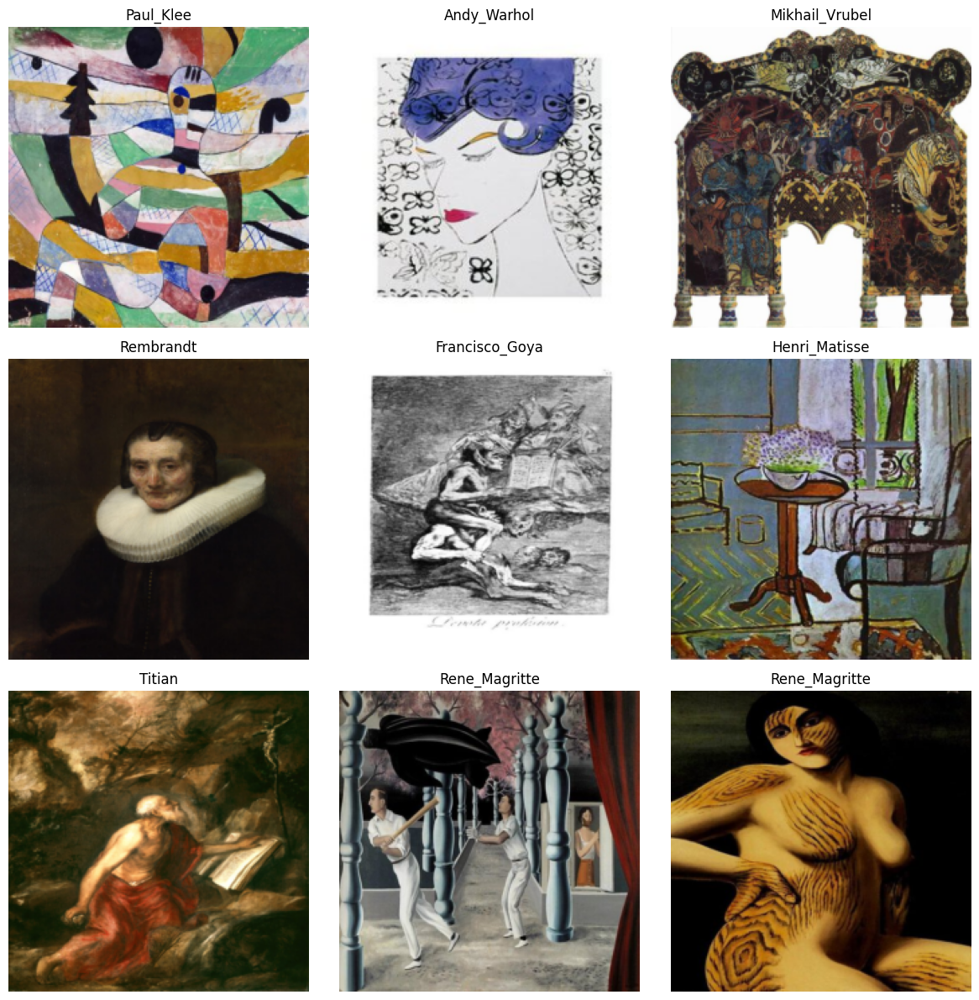

In [ ]:
plt.figure(figsize=(12, 12))

for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in train_generator:
        img = x_batch[0]
        # Get the index of the class from the one-hot encoded label
        label_index = np.argmax(y_batch[0])
        artist_name = list(train_generator.class_indices.keys())[label_index]

        plt.title(artist_name)
        plt.imshow(img)
        plt.axis('off')
        plt.grid(False)
        break

plt.tight_layout()
plt.show()

## Data augmentation

To enhance the diversity of our training data and improve the model's generalization capabilities, we apply data augmentation techniques.

We generate five augmented versions of each image using several augmentation techniques, including random rotations, translations, shearing, zooming, and horizontal flipping. These augmentations introduce variability to the training data, simulating real-world conditions and mitigating overfitting.

Before generating augmented images, we copy the original training images to the new directory. This ensures that both the original and augmented images are included in the training dataset.

In [ ]:
IMAGE_SIZE = 224
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_folder_train="./art_challenge_dataset/train1/all_images"
augmented_train_dir = "./art_challenge_dataset/augmented_train_images/"
os.makedirs(augmented_train_dir, exist_ok=True)

datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Copy original training images to augmented_train_dir
for index, row in train_df.iterrows():
    original_path = os.path.join(image_folder_train, row['filename'])
    shutil.copy(original_path, os.path.join(augmented_train_dir, row['filename']))

# Generate augmented images for training data
for index, row in train_df.iterrows():
    img_path = os.path.join(image_folder_train, row['filename'])
    img = load_img(img_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
    img_array = img_to_array(img)
    img_array = img_array.reshape((1,) + img_array.shape)

    i = 0
    for batch in datagen.flow(
        img_array,
        batch_size=1,
        save_to_dir=augmented_train_dir,
        save_prefix="_".join(row['filename'].split(".")[:-1]),
        save_format='jpg'
    ):
        i += 1
        if i >= 5:  # Generate 5 augmentations per image
            break

print("Training dataset enriched with augmented images.")


Training dataset enriched with augmented images.


Here is an exemple of an original image and the 5 augmented images created from it.

Name of the original image : Sandro_Botticelli_140.jpg


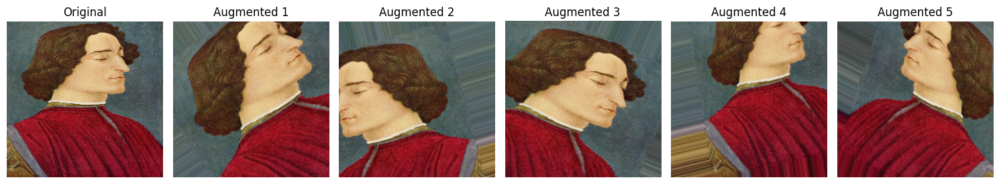

In [ ]:
example_img_path = os.path.join(image_folder_train, Data_truncated.iloc[10]['filename'])
example_img = load_img(example_img_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
example_array = img_to_array(example_img)
example_array = example_array.reshape((1,) + example_array.shape)

# Générer et afficher les augmentations
fig, axes = plt.subplots(1, 6, figsize=(15, 5))
axes[0].imshow(example_img)
axes[0].set_title("Original")
axes[0].axis("off")
print(f"Name of the original image : {Data_truncated.iloc[10]['filename']}")
i = 1
for batch in datagen.flow(example_array, batch_size=1):
    augmented_img = batch[0].astype('uint8')
    axes[i].imshow(augmented_img)
    axes[i].set_title(f"Augmented {i}")
    axes[i].axis("off")
    i += 1
    if i >= 6:  # Limiter à 5 augmentations
        break

plt.tight_layout()
plt.show()

Considering the augmented training images, we generate a DataFrame associating each image with its respective label. The process ensures that the augmented images are correctly organized for further training.

In [ ]:
import re

image_folder = augmented_train_dir
image_data = []

for image_name in os.listdir(image_folder):
    if image_name.endswith(".jpg"):
        # Extract the label using a regex: capture everything before _ and a digit
        # Example : Albrecht_Dürer_100_0_9548.jpg -> label = Albrecht_Dürer
        # Example : Titan_10.jpg -> label = Titan
        match = re.match(r"^(.*?)(?=_[0-9])", image_name)
        if match:
            artist_name = match.group(1)
        else:
            artist_name = "unknown"
        image_data.append({
            'filename': image_name,
            'label': artist_name
        })


train_generator_augmented = pd.DataFrame(image_data)
print('DataFrame : train_generator_augmented')
print(train_generator_augmented.head())
label_counts = train_generator_augmented['label'].value_counts()
print('-------------------------------------------------------------')
print(label_counts)

DataFrame : train_generator_augmented
                              filename                  label
0          Mikhail_Vrubel_71_0_364.jpg         Mikhail_Vrubel
1             Paul_Klee_157_0_5254.jpg              Paul_Klee
2            Andy_Warhol_42_0_9652.jpg            Andy_Warhol
3  Pierre-Auguste_Renoir_63_0_2631.jpg  Pierre-Auguste_Renoir
4                  Titian_93_0_445.jpg                 Titian
-------------------------------------------------------------
label
Titian                   840
Pierre-Auguste_Renoir    840
Vincent_van_Gogh         840
Alfred_Sisley            840
Albrecht_Dürer           840
Marc_Chagall             840
Paul_Gauguin             840
Edgar_Degas              840
Francisco_Goya           840
Pablo_Picasso            840
Rembrandt                840
Rene_Magritte            816
Amedeo_Modigliani        810
Paul_Klee                786
Henri_Matisse            780
Andy_Warhol              756
Mikhail_Vrubel           720
Sandro_Botticelli        690


Next, we create a generator from augmented training data.


In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    train_generator_augmented,
    directory=augmented_train_dir,
    x_col='filename',
    y_col='label',
    target_size=(img_width, img_height),
    class_mode='categorical',
    batch_size=batch_size,
    drop_remainder=True  # Ensures batches are full
)

Found 14598 validated image filenames belonging to 18 classes.


## Pre-trained Network


In this project, we use the VGG16 neural network, a pre-trained architecture for classification learning.

VGG16 is composed of 13 convolutional layers, 5 max-pooling layers, and 3 fully connected layers. Therefore, the number of layers having tunable parameters is 16 (13 convolutional layers and 3 fully connected layers). That is the reason why the model name is VGG16.

_Source : https://lekhuyen.medium.com/an-overview-of-vgg16-and-nin-models-96e4bf398484_


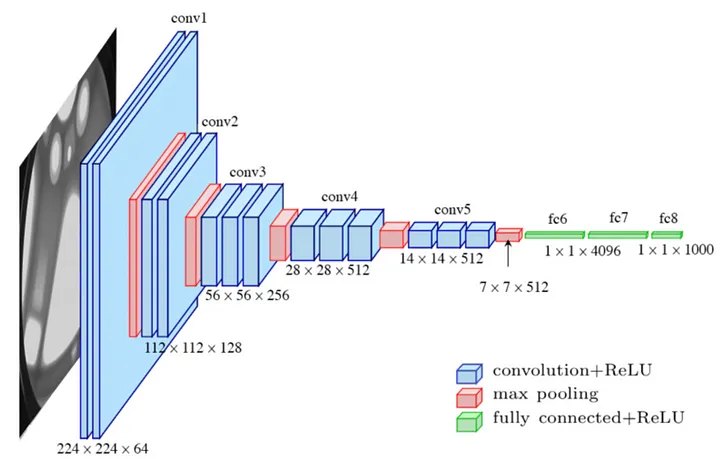

_Source: Researchgate.net_

The convolutional base of VGG16 is used for feature extraction, as it contains layers specifically designed to capture hierarchical patterns in images, such as edges, textures, and more complex structures. By excluding the fully connected layers at the top of the original architecture, we ensure flexibility in adapting the network to our specific classification task.

For this project, we set the input size to 224×224 pixels, the standard input dimensions for VGG16, as mencioned before. This ensures compatibility with the pre-trained model while allowing us to incorporate additional layers tailored to the classification of the 18 artists in our dataset.

In [ ]:
from tensorflow.keras.applications import VGG16

In [ ]:
conv_base = VGG16(
    weights = 'imagenet', # We use the network weights already pre-trained on the ImageNet database.
    include_top = False,  # The Fully Connected part of the original network is not retained
    input_shape = (img_width, img_height, 3)
)

conv_base.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

After defining the convolutional base of the pre-trained VGG16 model for feature extraction, we construct a custom architecture by adding fully connected layers tailored to our classification task. This step allows us to adapt the pre-trained features to distinguish between the 18 artists in our dataset.

The added architecture includes:

* Global Average Pooling

Converts the spatial feature maps from the convolutional base into a fixed-length vector, summarizing the information from each feature map while reducing the number of parameters compared to a fully connected layer.

* Dense layers

Two Dense layers with 256 units each and ReLU activation to learn complex patterns in the extracted features.

* Dropout layers

Dropout layers prevent overfitting by randomly deactivating a fraction of neurons during training.

* Output Layer

A Dense layer with a softmax activation function and a number of units equal to the number of classes (18 in this case), providing probabilities for each artist.



In [ ]:
from tensorflow.keras import models, layers

def model_vgg(input_shape, num_classes):
    model = models.Sequential()
    model.add(conv_base)
    model.add(GlobalAveragePooling2D())
    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model


We configure the optimization strategy and incorporating an optimizer and a learning rate scheduler during training:

* Optimizer

We use the Adam optimizer which is a popular choice for deep learning tasks because it combines the advantages of two other extensions of stochastic gradient descent (SGD): adaptive gradient (AdaGrad) and root mean square propagation (RMSProp). This helps the model converge faster and efficiently handle sparse gradients.

* Learning Rate Scheduler

A ReduceLROnPlateau callback is included to monitor the validation loss and reduce the learning rate dynamically if the loss stops improving.

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-10)
opt = Adam(learning_rate=3e-4)


In [ ]:
num_classes = 18
model = model_vgg(input_shape=(img_width, img_height, 3), num_classes=num_classes)

# Phase 1: Transfert d'apprentissage
conv_base.trainable = False  # We freeze the VGG16 base
model.compile(loss='categorical_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

# Training
epochs = 30
batch_size = 32

history_1 = model.fit(
    train_generator,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=validation_generator,
    callbacks=reduce_lr
)


Epoch 1/30


/home/vazqueza/.conda/envs/tensorflow/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734511916.734065    7826 service.cc:146] XLA service 0x7c8ef4006980 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734511916.734109    7826 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2024-12-18 09:51:57.461550: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-18 09:51:59.193226: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8

  1/913 ━━━━━━━━━━━━━━━━━━━━ 5:19:05 21s/step - accuracy: 0.0625 - loss: 3.2256

I0000 00:00:1734511934.388977    7826 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


913/913 ━━━━━━━━━━━━━━━━━━━━ 160s 153ms/step - accuracy: 0.1305 - loss: 2.7734 - val_accuracy: 0.4061 - val_loss: 2.0666 - learning_rate: 3.0000e-04
Epoch 2/30
913/913 ━━━━━━━━━━━━━━━━━━━━ 43s 47ms/step - accuracy: 0.3430 - loss: 2.0845 - val_accuracy: 0.4885 - val_loss: 1.7455 - learning_rate: 3.0000e-04
Epoch 3/30
913/913 ━━━━━━━━━━━━━━━━━━━━ 50s 54ms/step - accuracy: 0.4255 - loss: 1.8296 - val_accuracy: 0.5460 - val_loss: 1.5569 - learning_rate: 3.0000e-04
Epoch 4/30
913/913 ━━━━━━━━━━━━━━━━━━━━ 40s 44ms/step - accuracy: 0.4835 - loss: 1.6365 - val_accuracy: 0.5862 - val_loss: 1.4127 - learning_rate: 3.0000e-04
Epoch 5/30
913/913 ━━━━━━━━━━━━━━━━━━━━ 42s 45ms/step - accuracy: 0.5275 - loss: 1.5262 - val_accuracy: 0.5824 - val_loss: 1.3737 - learning_rate: 3.0000e-04
Epoch 6/30
913/913 ━━━━━━━━━━━━━━━━━━━━ 48s 52ms/step - accuracy: 0.5433 - loss: 1.4536 - val_accuracy: 0.5939 - val_loss: 1.3186 - learning_rate: 3.0000e-04
Epoch 7/30
913/913 ━━━━━━━━━━━━━━━━━━━━ 40s 44ms/step - accur

In [ ]:
def plot_training_analysis(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.subplot(1,2,1)
    plt.plot(epochs, acc, 'b', linestyle="--",label='Training accuracy')
    plt.plot(epochs, val_acc, 'g', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.subplot(1,2,2)
    plt.plot(epochs, loss, 'b', linestyle="--",label='Training loss')
    plt.plot(epochs, val_loss,'g', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

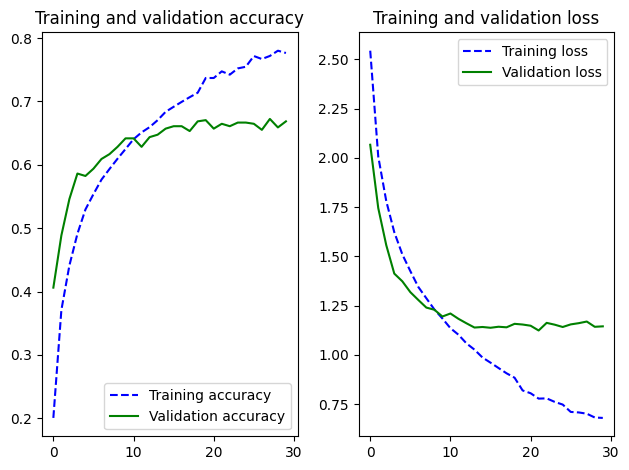

In [ ]:
plot_training_analysis(history_1)

We observe that the accuracy and loss could continue evolving.
We will now apply the second phase: fine-tunning.

In [ ]:
# Phase 2: Fine-tuning
fine_epochs = 20
conv_base.trainable = True  # On dégèle les couches de VGG16

# Réduire le learning rate pour le fine-tuning
opt = Adam(learning_rate=1e-6)

model.compile(loss='categorical_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

history_2 = model.fit(
    train_generator,
    epochs=fine_epochs,
    batch_size=batch_size,
    validation_data=validation_generator,
    callbacks=reduce_lr #[early_stopping, reduce_lr]
)


Epoch 1/20
  1/913 ━━━━━━━━━━━━━━━━━━━━ 5:32:17 22s/step - accuracy: 0.6250 - loss: 0.7545

2024-12-18 10:15:52.208611: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_9', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_10', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_8', 4 bytes spill stores, 12 bytes spill loads



409/913 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - accuracy: 0.7852 - loss: 0.6686

2024-12-18 10:16:52.696751: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_9', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_10', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_8', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_12', 164 bytes spill stores, 232 bytes spill loads



913/913 ━━━━━━━━━━━━━━━━━━━━ 163s 155ms/step - accuracy: 0.7868 - loss: 0.6596 - val_accuracy: 0.6782 - val_loss: 1.1257 - learning_rate: 1.0000e-06
Epoch 2/20
913/913 ━━━━━━━━━━━━━━━━━━━━ 132s 144ms/step - accuracy: 0.8088 - loss: 0.5802 - val_accuracy: 0.6686 - val_loss: 1.1623 - learning_rate: 1.0000e-06
Epoch 3/20
913/913 ━━━━━━━━━━━━━━━━━━━━ 137s 150ms/step - accuracy: 0.8174 - loss: 0.5491 - val_accuracy: 0.6801 - val_loss: 1.1642 - learning_rate: 1.0000e-06
Epoch 4/20
913/913 ━━━━━━━━━━━━━━━━━━━━ 141s 154ms/step - accuracy: 0.8375 - loss: 0.5042 - val_accuracy: 0.7031 - val_loss: 1.1636 - learning_rate: 1.0000e-06
Epoch 5/20
913/913 ━━━━━━━━━━━━━━━━━━━━ 142s 154ms/step - accuracy: 0.8483 - loss: 0.4604 - val_accuracy: 0.6992 - val_loss: 1.1284 - learning_rate: 5.0000e-07
Epoch 6/20
913/913 ━━━━━━━━━━━━━━━━━━━━ 140s 153ms/step - accuracy: 0.8522 - loss: 0.4427 - val_accuracy: 0.7031 - val_loss: 1.1263 - learning_rate: 5.0000e-07
Epoch 7/20
913/913 ━━━━━━━━━━━━━━━━━━━━ 138s 150ms/

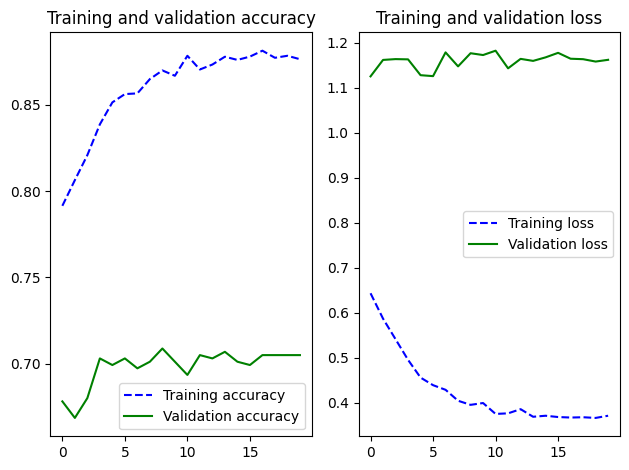

In [ ]:
plot_training_analysis(history_2)

After fine-tunning, the accuracy and loss are better fitted. We achieved a test accuracy of 87.76% on the training set and a validation accuracy of 70.50%

## Prediction

After completing the training and validation process, we test the model on a separate test dataset that it has never seen before. This helps us assess its ability to generalize to new, unseen data.

By comparing the predicted labels with the ground truth, we compute the model's accuracy on the test set, providing a quantitative measure of its performance.

 To better understand the model's predictions, we randomly select a subset of test images and display them with their predicted and true labels. This qualitative assessment allows us to visually inspect where the model performs well or makes mistakes.  

 A green title means that the prediction is correct while a red one means it is incorrect.

33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - accuracy: 0.6770 - loss: 1.2148
Test accuracy: 0.7145593762397766


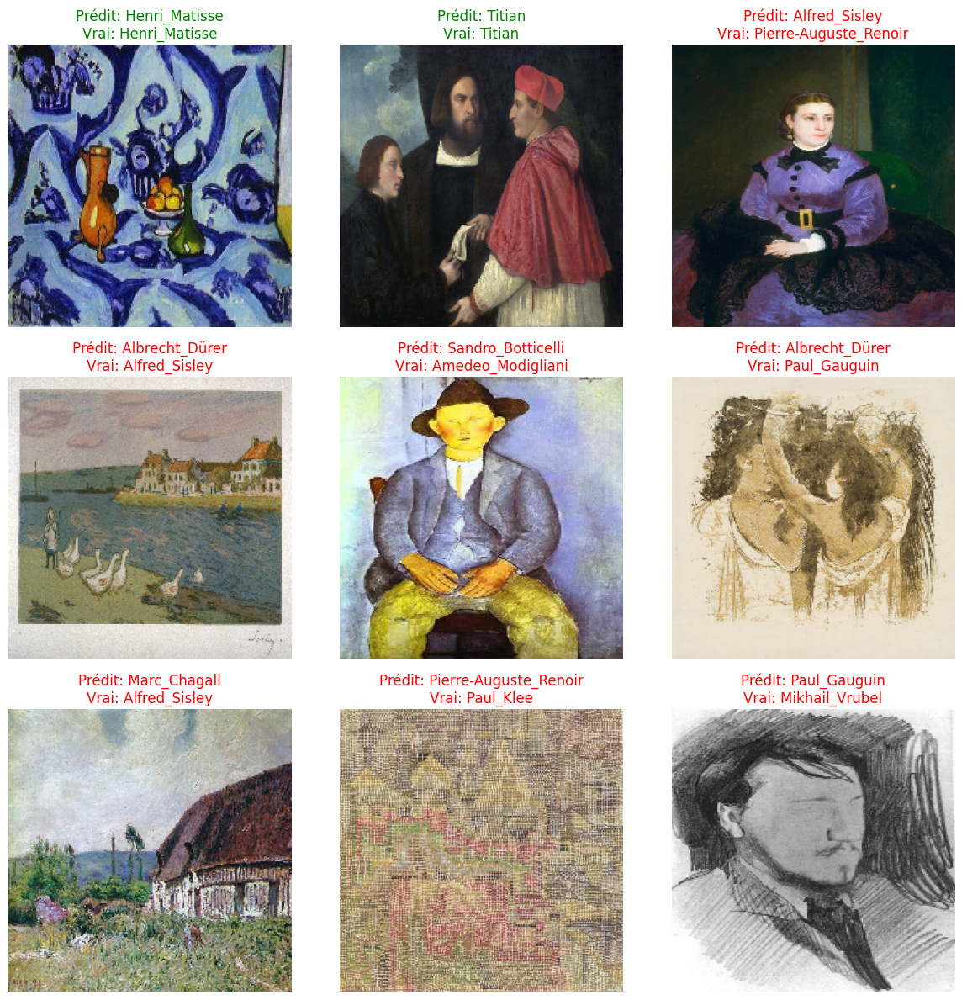

In [ ]:
test_prediction = model.predict(test_generator)  # Probabilities for the 18 classes
score_test = model.evaluate(test_generator)
print('Test accuracy:', score_test[1])

fig = plt.figure(figsize=(12, 12))

#Selecting 9 random images
test_imgs_idx = np.random.randint(low=0, high=len(test_generator.filenames), size=(9,))

for i, idx in enumerate(test_imgs_idx):
    img_path = test_generator.filepaths[idx]
    img = img_to_array(load_img(img_path, target_size=(img_width, img_height))) / 255.0

    pred = test_prediction[idx]
    predicted_class_index = np.argmax(pred)
    predicted_class_name = list(test_generator.class_indices.keys())[predicted_class_index]

    true_class_index = test_generator.labels[idx]
    true_class_name = list(test_generator.class_indices.keys())[true_class_index]

    color = "green" if predicted_class_name == true_class_name else "red"
    title = f"Prédit: {predicted_class_name}\nVrai: {true_class_name}"

    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title, color=color)

plt.tight_layout()
plt.show()


33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - accuracy: 0.7037 - loss: 1.1514
Test accuracy: 0.7145593762397766


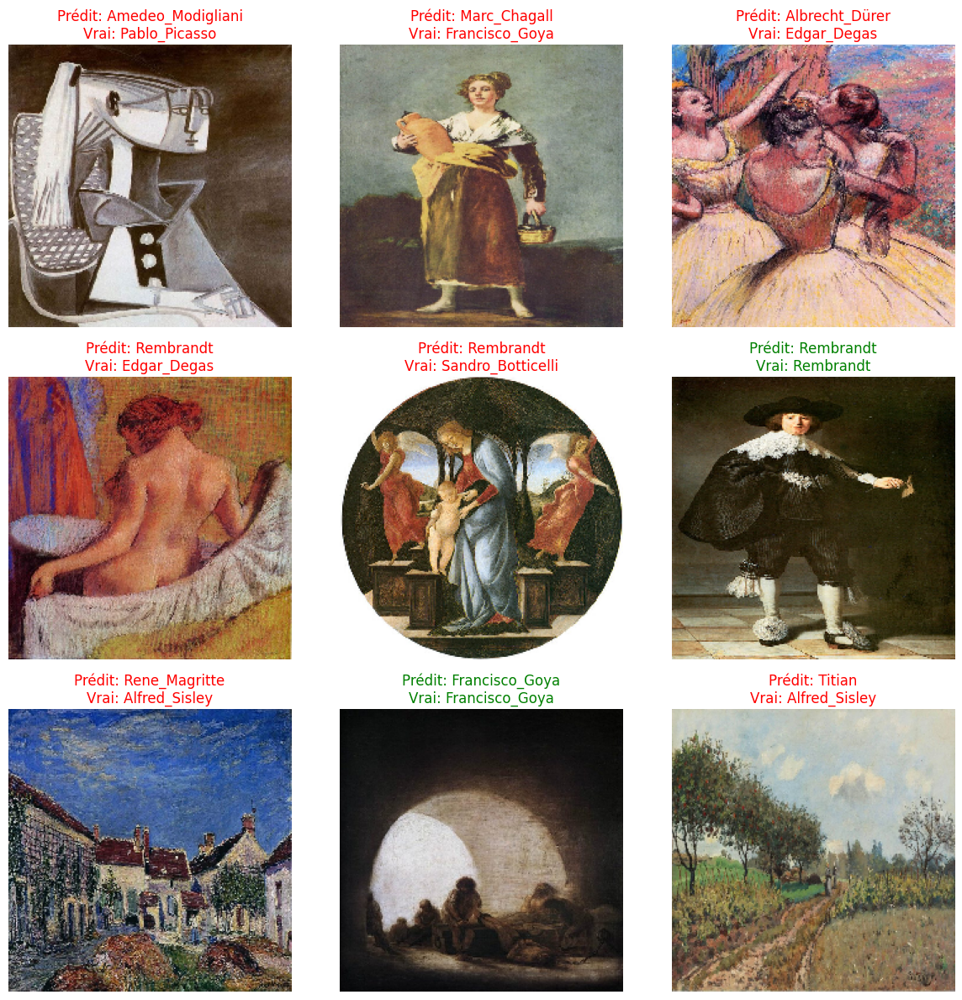

In [ ]:
test_prediction = model.predict(test_generator)  # Probabilities for the 18 classes
score_test = model.evaluate(test_generator)
print('Test accuracy:', score_test[1])

fig = plt.figure(figsize=(12, 12))

#Selecting 9 random images
test_imgs_idx = np.random.randint(low=0, high=len(test_generator.filenames), size=(9,))

for i, idx in enumerate(test_imgs_idx):
    img_path = test_generator.filepaths[idx]
    img = img_to_array(load_img(img_path, target_size=(img_width, img_height))) / 255.0

    pred = test_prediction[idx]
    predicted_class_index = np.argmax(pred)
    predicted_class_name = list(test_generator.class_indices.keys())[predicted_class_index]

    true_class_index = test_generator.labels[idx]
    true_class_name = list(test_generator.class_indices.keys())[true_class_index]

    color = "green" if predicted_class_name == true_class_name else "red"
    title = f"Prédit: {predicted_class_name}\nVrai: {true_class_name}"

    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title, color=color)

plt.tight_layout()
plt.show()


33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - accuracy: 0.7222 - loss: 0.9433
Test accuracy: 0.7145593762397766


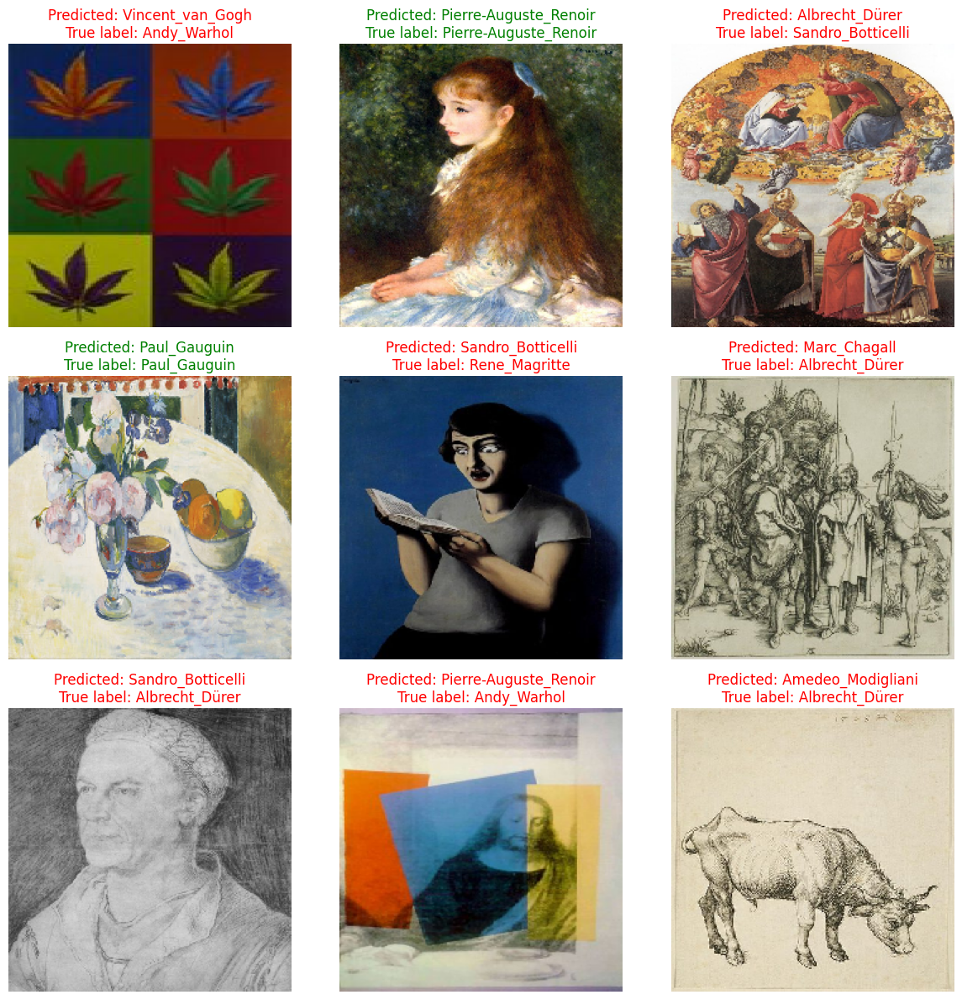

In [ ]:
test_prediction = model.predict(test_generator)  # Probabilities for the 18 classes
score_test = model.evaluate(test_generator)
print('Test accuracy:', score_test[1])

fig = plt.figure(figsize=(12, 12))

#Selecting 9 random images
test_imgs_idx = np.random.randint(low=0, high=len(test_generator.filenames), size=(9,))

for i, idx in enumerate(test_imgs_idx):
    img_path = test_generator.filepaths[idx]
    img = img_to_array(load_img(img_path, target_size=(img_width, img_height))) / 255.0

    pred = test_prediction[idx]
    predicted_class_index = np.argmax(pred)
    predicted_class_name = list(test_generator.class_indices.keys())[predicted_class_index]

    true_class_index = test_generator.labels[idx]
    true_class_name = list(test_generator.class_indices.keys())[true_class_index]

    color = "green" if predicted_class_name == true_class_name else "red"
    title = f"Prédit: {predicted_class_name}\nVrai: {true_class_name}"

    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title, color=color)

plt.tight_layout()
plt.show()

## Conclusion

In this project, we successfully built and fine-tuned a deep learning model to classify the artists of paintings using a pre-trained VGG16 architecture. By leveraging data augmentation and pre-processing techniques, we managed to improve the performance of the model despite the challenges posed by an imbalanced dataset and the variation in image quality.

After fine-tuning the VGG16 model with a learning rate reduction strategy, we achieved a test accuracy of 87.76% on the training set and a validation accuracy of 70.50%. This shows that the model is able to classify the artist of a painting with a reasonable degree of accuracy, though there is still room for improvement.